<a href="https://colab.research.google.com/github/thalestmm/credit_card_fraud_detection/blob/main/Credit_Card_Fraud_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://github.com/thalestmm/credit_card_fraud_detection/blob/main/images/Fraud_Detection.jpg?raw=true" alt="Banner">

# **Detecting Fraudulent Credit Card Transactions**

Credit cards are definitely a part of our lives nowadays, even with some transactions happening even without them phisically, but through our phones or smartwatches.

One recurring fact, whatsoever, is the ever-increasing rate of crimes envolving these credit cards. This type of fraud happens mostly when data from your card is obtained illegally through various sources, but mostly on database leakages or identity theft schemes ([FBI]("https://www.fbi.gov/scams-and-safety/common-scams-and-crimes/credit-card-fraud#:~:text=Credit%20card%20fraud%20is%20the,in%20an%20identity%20theft%20scheme"))

However, there are quite many measures you can take in order to prevent having your data stolen. Just to name a few:
* Make sure the website you're accessing has a security certificate;
* Don't give out your information to anyone you don't know;
* Don't believe every product or investment offer you receive via e-mail or on a website.

In order to avoid this kind of fraud, banking companies are always trying to early identify these events, so that the card can be blocked and the transaction fails.

With this in mind, we'll study a 2013 dataset from an European bank, available on the [Kaggle](https://www.kaggle.com/mlg-ulb/creditcardfraud) website. Keep in mind that there are many attributes (columns), but most of them aren't explicit. That is, through a PCA ([Principal Component Analysis](https://en.wikipedia.org/wiki/Principal_component_analysis)) transformation, the original data suffered a dimensionality reduction and was transformed into arbitrary values (`V`'s), so that the identity of the transactions can be kept safely.

##### *Initial Setup*

In [4]:
!pip install -U imbalanced-learn

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [6]:
default = plt.rcParams.copy()
from matplotlib import cycler
colors = cycler('color', ['#FFC30B', '#BFBFBF', '#595959'])
plt.rc('axes', facecolor='#FFFFFF', edgecolor='none',axisbelow=True, grid=False, prop_cycle=colors)
plt.rc('xtick', direction='out', color='#BFBFBF')
plt.rc('ytick', direction='out', color='#BFBFBF')
plt.rc('patch', edgecolor='#BFBFBF')
plt.rc('lines', linewidth=1)
plt.rc('figure',dpi=100)
plt.rc('savefig',dpi=200)

In [7]:
FILE_PATH = "/content/drive/MyDrive/COLAB FILES/creditcard.csv"

df = pd.read_csv(FILE_PATH)

## **Exploratory Data Analysis**

In [8]:
print(f"Total rows: {df.shape[0]}\nTotal columns: {df.shape[1]}")

Total rows: 284807
Total columns: 31


Our dataset has a total of **284407 entries** (rows), fulfilling **31 attributes** (columns). Below we can see the first 5 entries:

In [9]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


Because of that, the only columns we can actually describe are `Time`, `Amount` and `Class`: 
* `Time` - seconds elapsed from the first registered transaction on the dataset
* `Amount` - the total price of the transaction
* `Class` - if the transaction was fraudulent (`1`) or not (`0`) 

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

This brief overview shows us the absence of missing values among all attributes, so we won't need to deal with them. Also, all columns depict floating point numbers (`float64`), except for the `Class` attribute. Which, even tough comes as an integer (`int64`), actually represents categorical data (fraudulent or not).

One recurring problem with this kind of dataset is its imbalanced nature. That is, some categories show up much more often than others. As expected, we'll probably see a lot more real transactions than fraudulent ones, and so does this dataset bring with it.

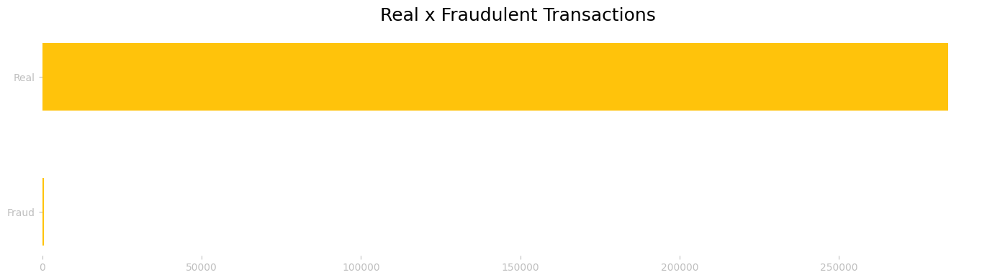

In [11]:
fig, ax = plt.subplots(figsize=(14,4))

labels = ["Fraud", "Real"]
values = [df.Class.value_counts()[1],df.Class.value_counts()[0]]

ax.set_title("Real x Fraudulent Transactions",fontsize=18,y=1.03)
plt.barh(labels,values,height=0.5)
#ax.set_xlabel("", c="#BFBFBF")

plt.tight_layout()

In [12]:
print(f"Total Real Transactions: {values[1]}\nTotal Frauds: {values[0]}")
print(f"% Frauds: {values[0]/df.shape[0]*100:.3f}%")

Total Real Transactions: 284315
Total Frauds: 492
% Frauds: 0.173%


As we can see, the dataset only registered a total of **492 frauds**, approximately **0.173%** of all the data. This is a clear example of the imbalance I mentioned earlier, and later on we'll discuss a few methods to attenuate this discrepancy.

### Data Distribution

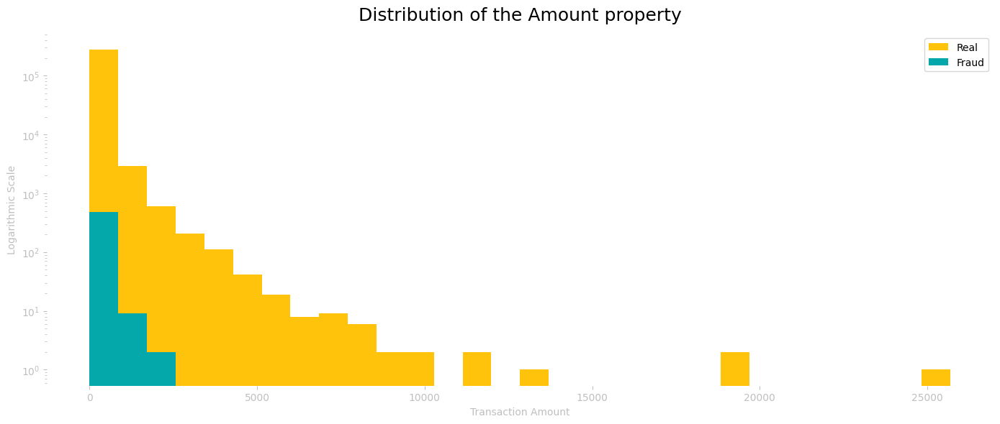

In [13]:
fig, ax = plt.subplots(figsize=(14,6))

palette = ["#05A8AA","#FFC30B"]
sns.histplot(data = df, x="Amount",bins=30,hue=df.Class,palette=palette,ax=ax,alpha=1.0,hue_order=[1,0],linewidth=0)
ax.set_title("Distribution of the Amount property",fontsize=18,y=1.02)
ax.set_ylabel("Logarithmic Scale",c="#BFBFBF")
ax.set_xlabel("Transaction Amount",c="#BFBFBF")
legend=["Real","Fraud"]
ax.legend(legend)
plt.yscale("log")

plt.tight_layout()
plt.savefig(fname="amount_hist.svg")

The distribution for the `Amount` property shows us that most frauds happen with the lowest transaction amounts. By looking strictly at this variable, we could say, for example, that any transaction with an amount larger than 5000 is probably real. But, we won't jump to any conclusions just yet.

In [14]:
print(f"Total time elapsed: {df.Time.max():.0f} seconds or {df.Time.max()/3600:.2f} hours")

Total time elapsed: 172792 seconds or 48.00 hours


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


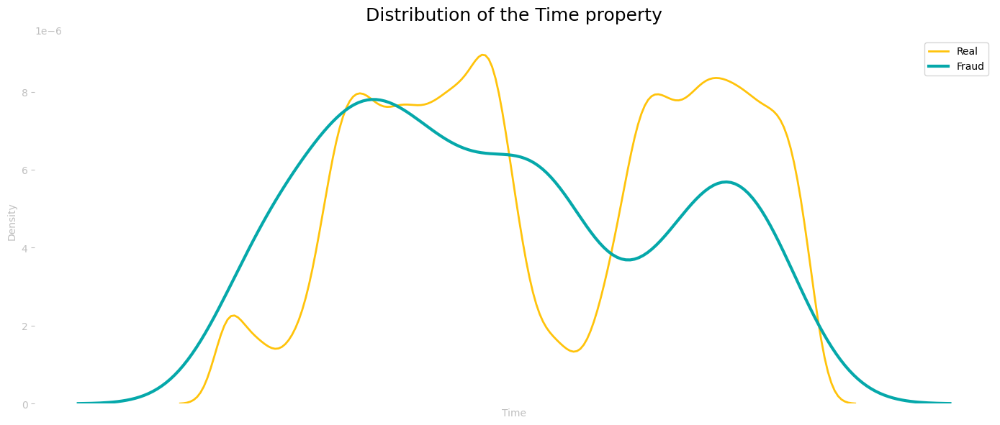

In [15]:
fig, ax = plt.subplots(figsize=(14,6))

ax.set_title("Distribution of the Time property", fontsize=18, y=1.03)
sns.distplot(df.Time.loc[df.Class == 0],bins=20,color="#FFC30B",hist=False,ax=ax,kde_kws={"linewidth": 2})
sns.distplot(df.Time.loc[df.Class == 1],bins=20,color="#05A8AA",hist=False,ax=ax,kde_kws={"linewidth": 3})
ax.set_ylabel("")
legend = ["Real","Fraud"]
ax.legend(legend)
ax.set_xticks([])
ax.set_xlabel("Time", c="#BFBFBF")
ax.set_ylabel("Density",c="#BFBFBF")

plt.tight_layout()
plt.savefig(fname="time_hist.svg")

The total range of the dataset accounts for 2 days (48 hours). In this distribution, every bar represents an hour. We can see, then, some seasonality plotted on the real transactions, most probably due to the nightly periods. The frauds, though, don't seem to obey this rule, as some of its peeks happen during the periods with less real transactions.

#### More specifically into the `Amount` variable

We'll now examine the `Amount` attribute, but only for the frauds (`Class` == 1).

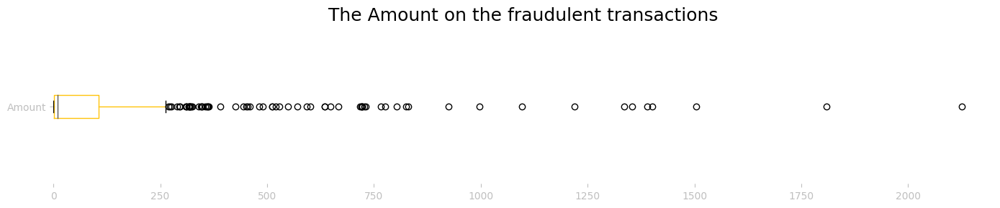

In [16]:
fig, ax = plt.subplots(figsize=(14,3))

target = df.loc[df.Class == 1].Amount
target.plot(kind="box",vert=False)
ax.set_xlim(0,2200)
ax.set_title("The Amount on the fraudulent transactions", fontsize=18, y=1.02)

plt.tight_layout()

In this *boxplot*, the *outliers* (unusual pieces of data given the overall daset), are depicted as the small circles. This comes to the same conclusion we saw above, on the `Amount` histogram. That is, the "normal" frauds happen with small amounts per transaction, and large values are not common.

In [17]:
target.describe()

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

We have a mean `Amount` of **122.21**, but the median is actually **9.25**. That means 50% of all frauds account for amounts of 9.25 or less. This discrepancy between the mean and the median comes from all the *outliers* I mentioned above.

#### Correlations: are there any?

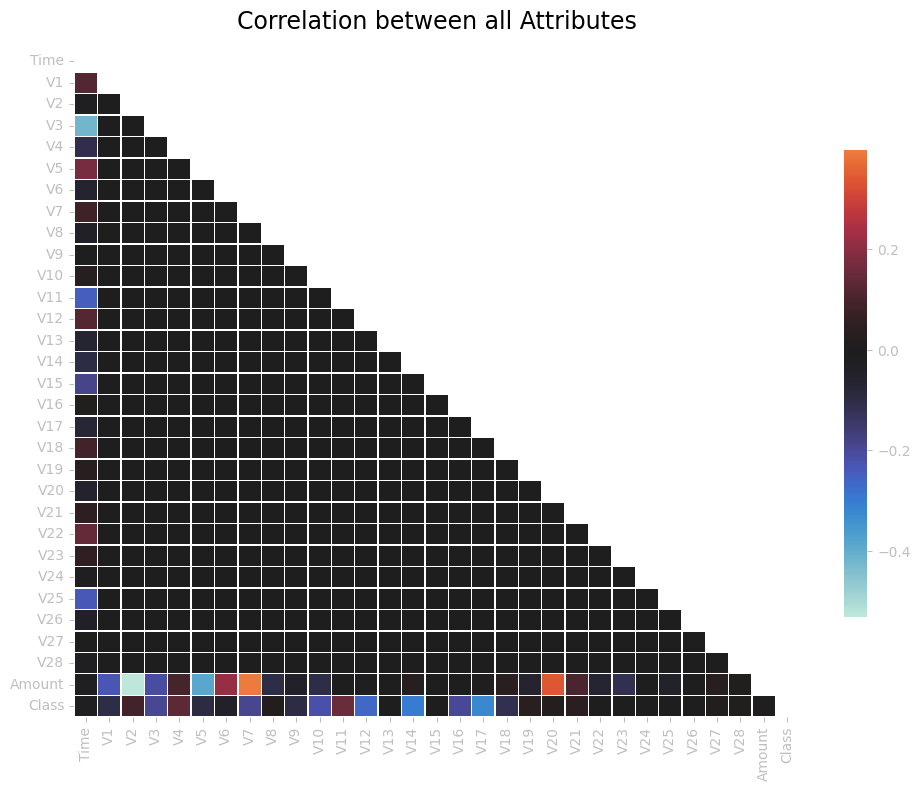

In [18]:
fig,ax = plt.subplots(figsize=(10,8))

heat_df = df.corr()
plt.title("Correlation between all Attributes", fontsize=17,y=1.02)
sns.color_palette("magma", as_cmap=True)
mask = np.triu(np.ones_like(heat_df, dtype=bool))
sns.heatmap(data=heat_df,annot=False,mask=mask,center=0,linewidths=0.3,annot_kws={"fontsize":12},cbar_kws={"shrink": .7});

plt.tight_layout()

From this noisy graphic, we can extract a few informations:
* Between all the undisclosed data (`V`'s), we cannot observe any correlation.
* Between the known attributes and the undisclosed data, though, we sometimes observe mild and strong correlations, both positive and negative.

This, in itself, is not enough to extract any knowledge. However, our Machine Learning model will later have something more to work with.

## **Prepping our Data**

Even though we don't know the true meaning of the undisclosed variables, something we can observe is that all of the data isn't in any particurlar scale or standard. 

In [19]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,9.170318e-16,-1.810658e-15,1.693438e-15,1.479045e-15,3.482336e-15,1.392007e-15,-7.528491e-16,4.328772e-16,9.049732e-16,5.085503e-16,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


Troughout the many Machine Learning models, some can deal better with this kind of data, but others cannot. A quick solution for this is to treat this data with some transformation.

First, we'll standardize the `Time` and `Amount` variables. That is, bring both of them to the same scale, where the standard deviation is 1.

For this, we'll subtract from each value its mean, and then divide by the standard deviation.

In [20]:
df.Time = (df.Time - df.Time.mean()) / df.Time.std()
df.Amount = (df.Amount - df.Amount.mean()) / df.Amount.std()

For Machine Learning models, we must divide our dataset in a Training set and a Test set, both with the independent variables (`X`) and the target or dependent variable (`y`).

In [21]:
X = df.drop(axis=1,columns=["Class"])
y = df.Class

In [22]:
X.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
count,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05
mean,-1.399629e-15,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,9.170318e-16,-1.810658e-15,1.693438e-15,1.479045e-15,3.482336e-15,1.392007e-15,-7.528491e-16,4.328772e-16,9.049732e-16,5.085503e-16,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,2.262609e-13
std,1.000000e+00,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,1.000000e+00
min,-1.996580e+00,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,-3.532288e-01
25%,-8.552105e-01,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,-3.308395e-01
50%,-2.131450e-01,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,-2.652710e-01
75%,9.372158e-01,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,-4.471699e-02
max,1.642055e+00,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,1.023621e+02


In [23]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit_transform(X);

Now, we can proceed to split our dataset:

In [24]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

I'll be using a 80/20 proportion. That is, 80% of the data will be used to train our model, while 20% will be used to test the results afterwards.

## **The Machine Learning Model**

### First Random Forest

For this classification problem (fraud or not), the main model I chose to work with is the **Random Forest Classifier**. As an upgrade to the traditional *Decision Trees*, this model comes with a variety of benefits that will be applied in this analysis, such as dealing with different subsets of the original data, handling missing values and dealing with the overfitting problem.

In [25]:
from sklearn.ensemble import RandomForestClassifier

# 1. Instantiate the model
model = RandomForestClassifier(n_estimators=100,random_state=0)

# 2. Train our model with the .fit() method 
model.fit(X_train,y_train)

RandomForestClassifier(random_state=0)

In [26]:
# 3. Make predictions for the test set
y_pred = model.predict(X_test)

In [27]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

print(f"Overall Accuracy: {accuracy_score(y_test, y_pred)*100:.2f}%")

Overall Accuracy: 99.95%


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56861
           1       0.92      0.78      0.84       101

    accuracy                           1.00     56962
   macro avg       0.96      0.89      0.92     56962
weighted avg       1.00      1.00      1.00     56962



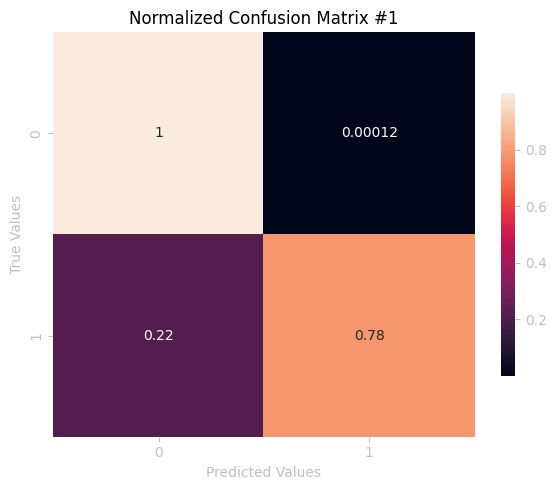

In [28]:
fig, ax = plt.subplots(figsize=(6,5))

norm_conf = [i for i in confusion_matrix(y_test,y_pred)]
norm_conf[0] = norm_conf[0] / norm_conf[0].sum()
norm_conf[1] = norm_conf[1] / norm_conf[1].sum()
sns.color_palette("magma", as_cmap=True)
sns.heatmap(data=norm_conf, annot=True,ax=ax,cbar_kws={"shrink": .7})
ax.set_title("Normalized Confusion Matrix #1",y=1.02)
ax.set_ylabel("True Values", c="#BFBFBF")
ax.set_xlabel("Predicted Values", c="#BFBFBF")

plt.tight_layout()
print(classification_report(y_test,y_pred))

**Precision** is a measure that represents, basically, the proportion of positive identifications that was correct. For this model, we have a precision of **0.92** in identifying frauds (*high precision relates to a low false positive rate*).

**Recall**, on the other side, shows us what proportion of *actual positives* was identified correctly. Here, we have a recall of **0.78**, which means that only 78% of the frauds were detected (*high recall relates to a low false negative rate*).

The **F1-Score** is a measure made from the harmonic mean between the precision and the recall, and for this model has a value of **0.84**.

The **Confusion Matrix** gathers all of the results and plots them on the heatmap above, showing both the actual and predicted values.

However, when dealing with highly imbalanced data (our case), such measures don't faithfully represent our actual result with the model. Some more adequate methods include **AP** (Average Precision) and the **ROC AUC** (Receiver Operating Characteristic Curve), as we can see below.


> OBS: *The original Kaggle page suggested the use of the AUPRC (Area Under the Precision-Recall Curve) method to determine the model's accuracy. However, this implementation was replaced by the AP, as the AUPRC generally returns too optmistic values* ([scikit-learn.org](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.average_precision_score.html#sklearn.metrics.average_precision_score))

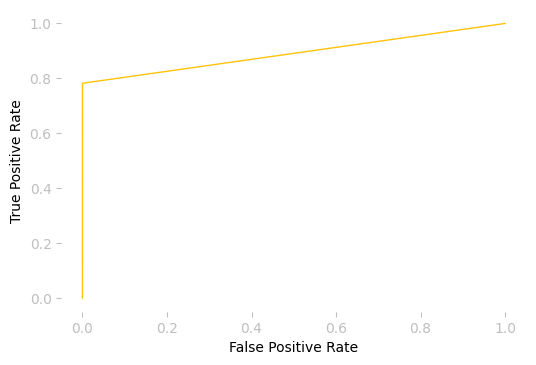

In [29]:
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(y_test,  y_pred)
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [30]:
from sklearn.metrics import roc_auc_score, PrecisionRecallDisplay, auc, average_precision_score

print(f"ROC AUC Score: {roc_auc_score(y_test,y_pred):.2f}")

ROC AUC Score: 0.89




> "*Higher the AUC, the better the model is at predicting 0 classes as 0 and 1 classes as 1. By analogy, the Higher the AUC, the better the model is at distinguishing between patients with the disease and no disease.*" [Towards Data Science](https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5)


Average Precision (AP): 0.72



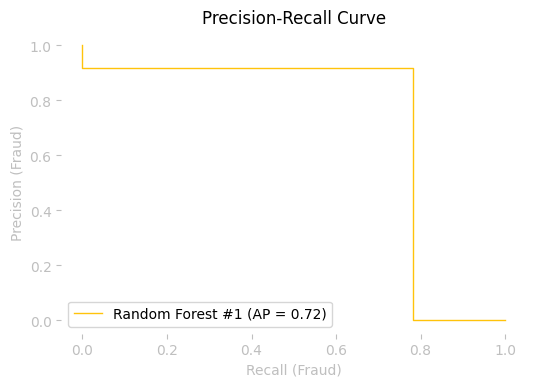

In [31]:
display = PrecisionRecallDisplay.from_predictions(y_test, y_pred, name="Random Forest #1")
_ = display.ax_.set_title("Precision-Recall Curve")
_ = display.ax_.set_xlabel("Recall (Fraud)",c="#BFBFBF")
_ = display.ax_.set_ylabel("Precision (Fraud)",c="#BFBFBF")

print(f"Average Precision (AP): {average_precision_score(y_test,y_pred):.2f}\n")

With the original imbalanced dataset, we have a **ROC AUC Score** of **0.84**, and an **Average Precision (AP)** of **0.72**.

We'll now treat the imbalance ratio, and then analyze the new results.

### Dealing with Imbalance

So far we've seen the results of our model, when dealing with the original imbalanced dataset. Now, through a series of transformations, we'll try to increase the model's performance, with a more balanced dataset.

In a case like this, we could take one of two (or both) approaches: undersampling or oversampling. The first applies a transformation to reduce the number of entries from the larger category. The latter does the opposite, as it tries to synthetically generate more values for the smaller category.

Among the many methods available, I chose to test and work with **SMOTE** (Synthetic Minority Oversampling Technique) for oversampling and the **Random Under Sampler** for undersampling.

#### *Setting up our treatment Pipeline*

In [32]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

over = SMOTE(sampling_strategy=0.1,random_state=0)
under = RandomUnderSampler(sampling_strategy=0.5,random_state=0)
steps = [('o',over),('u',under)]

pipeline = Pipeline(steps=steps)

In [33]:
# Before the transformation
example = [i for i in y.value_counts()]
print(f"Total Real Transactions: {example[0]}\nTotal Frauds: {example[1]}")
print(f"% Frauds: {example[1]/(example[1]+example[0])*100:.2f}%")

Total Real Transactions: 284315
Total Frauds: 492
% Frauds: 0.17%


In [34]:
# Apply the transformation 

X_train, y_train = pipeline.fit_resample(X_train,y_train)

In [35]:
# After the transformation
example = [i for i in y_train.value_counts()]
print(f"Total Real Transactions (training): {example[0]}\nTotal Frauds (training): {example[1]}")
print(f"% Frauds: {example[1]/(example[1]+example[0])*100:.2f}%")

Total Real Transactions (training): 45490
Total Frauds (training): 22745
% Frauds: 33.33%


In this approach, I chose to only treat the training data, leaving the test set untouched. That is because the test set should be a faithful representation of reality, and for that it's kept imbalanced.

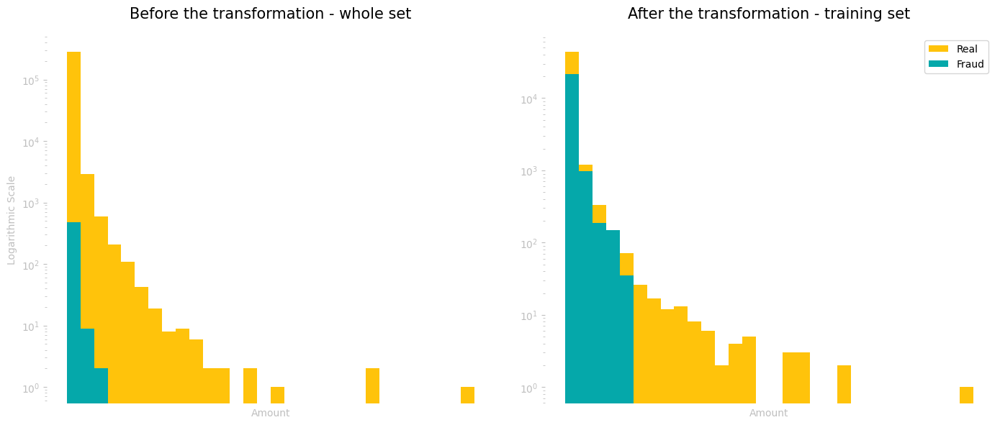

In [36]:
# Treatment Plot

fig,(ax1,ax2) = plt.subplots(figsize=(14,6),nrows=1,ncols=2)

example_df = X_train.copy().merge(y_train.rename('Class'), left_index=True, right_index=True)
ax1.set_title("Before the transformation - whole set", fontsize=15,y=1.03)
ax2.set_title("After the transformation - training set", fontsize=15,y=1.03)
sns.histplot(data = df, x="Amount", bins=30,hue=df.Class,palette=palette,ax=ax1,alpha=1.0,hue_order=[1,0],linewidth=0,legend=False)
sns.histplot(data = example_df, x="Amount",bins=30,hue="Class",palette=palette,ax=ax2,alpha=1.0,hue_order=[1,0],linewidth=0)
ax2.legend(legend)
ax1.set_ylabel("Logarithmic Scale", c = "#BFBFBF")
ax2.set_ylabel(" ")
ax1.set_xlabel("Amount", c = "#BFBFBF")
ax2.set_xlabel("Amount", c = "#BFBFBF")
ax1.set_yscale("log")
ax2.set_yscale("log")
ax1.set_xticks([])
ax2.set_xticks([])

plt.tight_layout()
plt.savefig(fname="imbalance_comparison.svg")

### New Random Forest

In [37]:
# 1. Instantiate the model
model = RandomForestClassifier(n_estimators=100,random_state=0)

# 2. Train our model with the .fit() method 
model.fit(X_train,y_train)

RandomForestClassifier(random_state=0)

**Visualizing one of the decision trees:**

In [38]:
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [39]:
# 3. Make predictions for the test set
from datetime import datetime
start=datetime.now()

y_pred = model.predict(X_test)

print(f"Total Run Time: {(datetime.now()-start).seconds}.{(datetime.now()-start).microseconds/10000:.0f} seconds\n")

Total Run Time: 1.21 seconds



While predicting, we have a run time of **0.74 seconds**. This value, although high, represents the prediction for a large amount of data, *13.5 MB* of the test set. For real applications, the evaluated dataset would be much smaller and so the run time.

In [40]:
X_test.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56962 entries, 183484 to 246221
Columns: 30 entries, Time to Amount
dtypes: float64(30)
memory usage: 13.5 MB


In [41]:
test_list = np.array([i for i in range(30)]).reshape(1,-1)
start=datetime.now()

test_pred = model.predict(test_list)

print(f"Total Run Time: {(datetime.now()-start).seconds}.{(datetime.now()-start).microseconds/100:.0f} seconds\n")

Total Run Time: 0.203 seconds



/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"


In [42]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

print(f"Overall Accuracy: {accuracy_score(y_test, y_pred)*100:.2f}%")

Overall Accuracy: 99.92%


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56861
           1       0.72      0.86      0.79       101

    accuracy                           1.00     56962
   macro avg       0.86      0.93      0.89     56962
weighted avg       1.00      1.00      1.00     56962



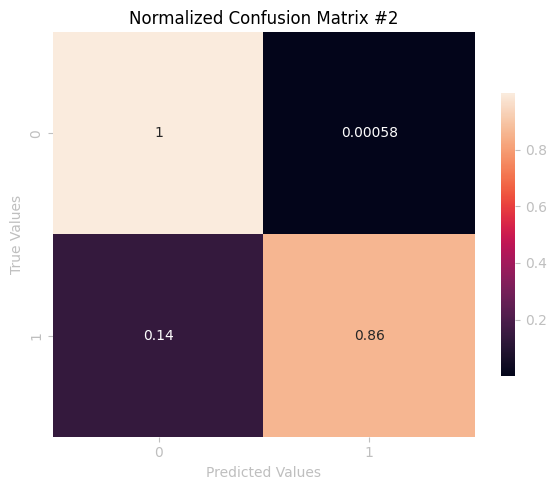

In [43]:
fig, ax = plt.subplots(figsize=(6,5))

norm_conf = [i for i in confusion_matrix(y_test,y_pred)]
norm_conf[0] = norm_conf[0] / norm_conf[0].sum()
norm_conf[1] = norm_conf[1] / norm_conf[1].sum()
sns.color_palette("magma", as_cmap=True)
sns.heatmap(data=norm_conf, annot=True,ax=ax,cbar_kws={"shrink": .7})
ax.set_title("Normalized Confusion Matrix #2",y=1.02)
ax.set_ylabel("True Values", c="#BFBFBF")
ax.set_xlabel("Predicted Values", c="#BFBFBF")

plt.tight_layout()
print(classification_report(y_test,y_pred))

In [44]:
from sklearn.metrics import roc_auc_score, PrecisionRecallDisplay, auc, average_precision_score

print(f"ROC AUC Score: {roc_auc_score(y_test,y_pred):.2f}")

ROC AUC Score: 0.93


Average Precision (AP): 0.62



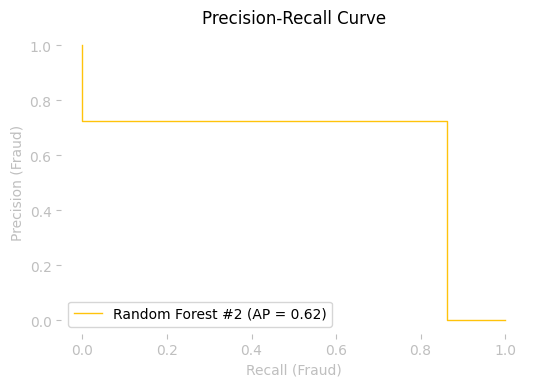

In [45]:
display = PrecisionRecallDisplay.from_predictions(y_test, y_pred, name="Random Forest #2")
_ = display.ax_.set_title("Precision-Recall Curve")
_ = display.ax_.set_xlabel("Recall (Fraud)",c="#BFBFBF")
_ = display.ax_.set_ylabel("Precision (Fraud)",c="#BFBFBF")

print(f"Average Precision (AP): {average_precision_score(y_test,y_pred):.2f}\n")

With the new results, we can observe a sacrifice of Precision on behalf of increasing the Recall. For this specific model, such sacrifice is justifiable, as it's more desirable to find false positives than more false negatives. Because of that, the Average Precision dropped in 1.0 absolute points, reaching **0.62**.

However, or **ROC AUC** actually increased 0.5 points, staying now at **0.94**. For our model, this is the most important metric.

## **Conclusion**

In this project, it was possible to identify the **Random Forest** algorithm as an effective way to classify fraudulent credit card transactions. From a large and imbalanced dataset, we could test the model's accuracy prior to treating the data and afterwards.

In order to treat the imbalance, 2 techniques were applied to the training set: **SMOTE** and **Random Under Sampling**. With them, a original imbalance of **0.17%** on the fraudulent transactions was turned into a proportion of **66/33** between the categories.

The main chosen metric to evaluate the model's performance, the **ROC AUC**, was significantly improved from the raw model to the treated one: **0.89** and **0.94** scores, respectively.

The imbalance treatment effectively improved the model's performance, but also increased the false positive ratio. Due to the problem's nature, this result is justifiable, as it's desirable to better detect frauds, on behalf of a few more false positives.

Thanks for the support!

*Thales M. Meier*